In [1]:
from time import time
import pandas as pd
import numpy as np
from PIL import Image
import keras.layers.advanced_activations
import scipy
import random
import matplotlib.pyplot as plt  
from scipy.stats import norm  
import keras
from keras.models import Sequential
from keras.initializers import VarianceScaling,RandomNormal
from keras.layers import Input, Dense, Dropout, Conv2D, MaxPooling2D,concatenate
from keras.layers import UpSampling2D, Reshape, Lambda, Flatten, Activation,Concatenate
from keras.models import Model  
from keras.optimizers import SGD, Adadelta, Adagrad,Adam
from keras import backend as K  
from keras import objectives  
from keras.utils.vis_utils import plot_model  
from keras.utils import np_utils, generic_utils
import sys 
import tensorflow as tf
from keras.callbacks import TensorBoard, ModelCheckpoint
from keras.layers import BatchNormalization
from keras.layers.normalization import BatchNormalization
import matplotlib.pyplot as plt
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import sklearn
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
%matplotlib inline
from sklearn import manifold, datasets,cluster
from sklearn.utils import check_random_state
from sklearn import metrics

Using TensorFlow backend.


In [2]:
path = os.listdir('Unlabel_data_100k/')
Image = []
for i in range(len(path)):
    path_now = path[i]
    a = np.load('Unlabel_data_100k/'+str(path_now))
    Image.append(a)

Image = np.asarray(Image)
Image_RGB = Image.transpose(0,2,3,1)
for i in range(len(Image_RGB)):
    if True in np.isnan(Image_RGB[i]).reshape(64*64*5):
        print(i)
        Image_RGB[i][np.isnan(Image_RGB[i])==True]=np.mean(Image_RGB[0])
#show_Image_RGB = (Image_RGB - np.min(Image_RGB))/(np.max(Image_RGB) - np.min(Image_RGB))*2 - np.ones_like(Image_RGB)
#Image_RGB -= np.mean(Image_RGB)
#Image_RGB /= np.std((Image_RGB))


Image_RGB /= np.max(Image_RGB)
Image_RGB -= np.mean(Image_RGB)
Image_RGB = -Image_RGB
data = Image_RGB
index = [i for i in range(len(data))]
#random.shuffle(index)
train_data = data[index]
print('train_data.shape:',train_data.shape)


25103
51048
64260
train_data.shape: (100000, 64, 64, 5)


In [3]:
batch_size =100
latent_dim = 30
nb_epoch = 50
intermediate_dim =512
original_dim = 64*64
LRelu = keras.layers.advanced_activations.LeakyReLU(alpha=0.3)

USE = 'autoencoder'
#USE = 'vae'
#encoder:

input_img = Input(shape=(64,64,5))

conv_1 = Conv2D(40, (3, 3), padding='same',kernel_initializer='normal')(input_img)
conv_1 = Activation(LRelu)(conv_1)
conv_1 = BatchNormalization()(conv_1)
maxpool_1 = MaxPooling2D((2, 2),padding='same')(conv_1)

conv_2 = Conv2D(40, (3, 3), padding='same',kernel_initializer='normal')(maxpool_1)
conv_2 = Activation(LRelu)(conv_2)
conv_2 = BatchNormalization()(conv_2)
maxpool_2 = MaxPooling2D((2, 2),  padding='same')(conv_2)

conv_3 = Conv2D(20, (3, 3),padding='same',kernel_initializer='normal')(maxpool_2)
conv_3 = Activation(LRelu)(conv_3)
conv_3 = BatchNormalization()(conv_3)
maxpool_3 = MaxPooling2D((2, 2),  padding='same')(conv_3)

conv_4 = Conv2D(20, (3, 3),padding='same',kernel_initializer='normal')(maxpool_3)
conv_4 = Activation(LRelu)(conv_4)
conv_4 = BatchNormalization()(conv_4)
maxpool_4 = MaxPooling2D((2, 2),  padding='same')(conv_4)

#conv_5 = Conv2D(20, (3, 3), activation='relu', padding='same',kernel_initializer='normal')(maxpool_4)
#maxpool_5 = MaxPooling2D((2, 2),  padding='same')(conv_5)


#x = Conv2D(5, (3, 3), activation='relu', padding='same',kernel_initializer='normal')(x)
#x = MaxPooling2D((2, 2),  padding='same')(x)

visual = Flatten()(maxpool_4)
h_1 = Dense(intermediate_dim, activation='relu')(visual)#relu?
encoded = Dense(latent_dim, activation='tanh')(h_1)# relu?


if USE == 'autoencoder':
    h_3 = Dense(intermediate_dim,activation=LRelu)(encoded)#for AE
    
    
h_4 = Dense(20*4*4,activation=LRelu)(h_3)
h_5 = Reshape((4,4,20))(h_4)


#conv_6 = Conv2D(20, (3, 3), activation='relu', padding='same',kernel_initializer='normal')(h_5)
#upsample_6 = UpSampling2D((2, 2))(conv_6)

#conv_7 = Conv2D(20, (3, 3), activation='relu', padding='same',kernel_initializer='normal')(h_5)
upsample_7 = UpSampling2D((2, 2))(h_5)

conv_8 = Conv2D(20, (3, 3), activation='relu', padding='same',kernel_initializer='normal')(upsample_7)
upsample_8 = UpSampling2D((2, 2))(conv_8)

conv_9 = Conv2D(40, (3, 3), activation='relu', padding='same',kernel_initializer='normal')(upsample_8)
upsample_9 = UpSampling2D((2, 2))(conv_9)

conv_10 = Conv2D(80,  (3, 3), activation='relu',padding='same',kernel_initializer='normal')(upsample_9)
upsample_10 = UpSampling2D((2, 2))(conv_10)

decoded = Conv2D(5, (3, 3), activation='tanh', padding='same')(upsample_10)


EarlyStopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto')


#def vae_loss(x, decoded):  
#    xent_loss = K.sum(K.sum(objectives.binary_crossentropy(x ,decoded),axis=-1),axis=-1)
#    kl_loss = - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1) 
#    return xent_loss + 1*kl_loss  

def ae_loss(x, decoded):  
    xent_loss = original_dim * objectives.mean_squared_error(x,decoded)
    return xent_loss

if USE == 'autoencoder':
    autoencoder = Model(inputs=input_img, outputs=decoded)
    autoencoder.compile(optimizer='rmsprop', loss=ae_loss)

/home/sunhao/anaconda3/lib/python3.6/site-packages/keras/activations.py:103: UserWarning: Do not pass a layer instance (such as LeakyReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  ).format(identifier=identifier.__class__.__name__))


In [4]:
autoencoder.load_weights('hennanxunliande.h5')

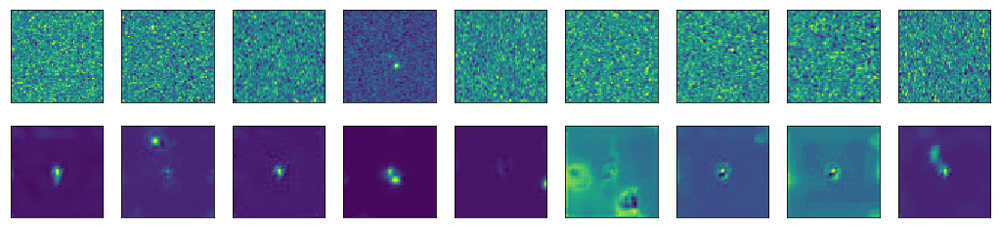

In [5]:
decoded_imgs = autoencoder.predict(train_data[0:100],batch_size=100)

n = 10  # how many digits we will display
plt.figure(figsize=(20, 4))
for i in range(1,n):
    # display original
    ax = plt.subplot(2,n,i)
    plt.imshow((train_data[0:100][i][:,:,0]))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n ,i + n)
    plt.imshow((decoded_imgs[i][:,:,0]))
    #plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [6]:
encoder = Model(inputs=input_img, outputs=encoded)
encoded_variables = encoder.predict(train_data[:100000],batch_size=100)
encoded_variables.shape

(100000, 30)

In [7]:
Zero_one_normalized_encoded_variables = encoded_variables#/np.std(encoded_variables)/2

In [8]:
path = os.listdir('SDSS_20k/')

test_Image = []
Class = []

for i in range(len(path)):
    path_now = path[i]
    a = np.load('SDSS_20k/'+str(path_now))
    for j in range(a.shape[0]):
        test_Image.append(a[j]['image'])
        Class.append(a[j]['class'])


test_Image = np.asarray(test_Image)
Class = np.asarray(Class)
Class[Class=='STAR'] = 0
Class[Class=='GALAXY'] = 1
Class[Class=='QSO'] = 2
Class = Class.astype(int)

test_Image_RGB = test_Image.transpose(0,2,3,1)

for i in range(len(test_Image_RGB)):
    if True in np.isnan(test_Image_RGB[i]).reshape(64*64*5):
        print(i)
        test_Image_RGB[i][np.isnan(test_Image_RGB[i])==True]=np.mean(test_Image_RGB[0])
#show_Image_RGB = (Image_RGB - np.min(Image_RGB))/(np.max(Image_RGB) - np.min(Image_RGB))*2 - np.ones_like(Image_RGB)
#Image_RGB -= np.mean(Image_RGB)
#Image_RGB /= np.std((Image_RGB))


test_Image_RGB /= np.max(test_Image_RGB)
test_Image_RGB -= np.mean(test_Image_RGB)
test_Image_RGB = -test_Image_RGB

872
15249
32951
37233
37879
45552
63104
63918
72767
81185
88285
96972
101023
122609


/home/sunhao/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:36: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("de...)`
/home/sunhao/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`
/home/sunhao/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:51: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`


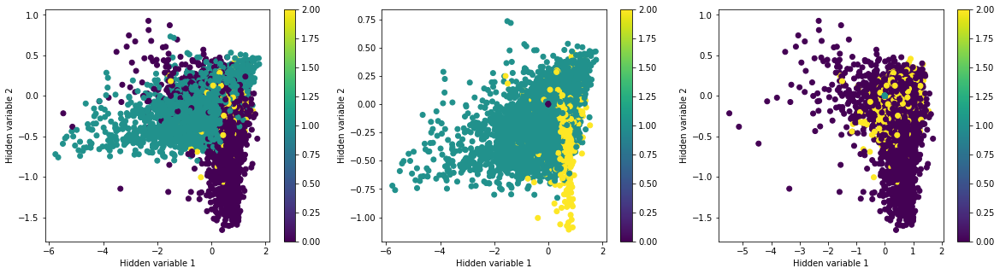

1019
0.902748579401


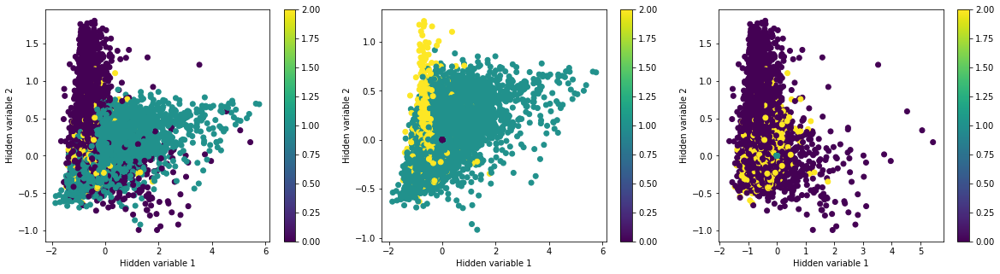

1019
0.904397662033


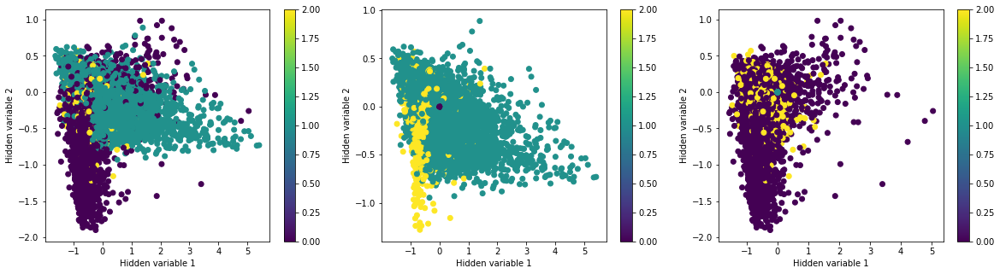

1019
0.902719814991


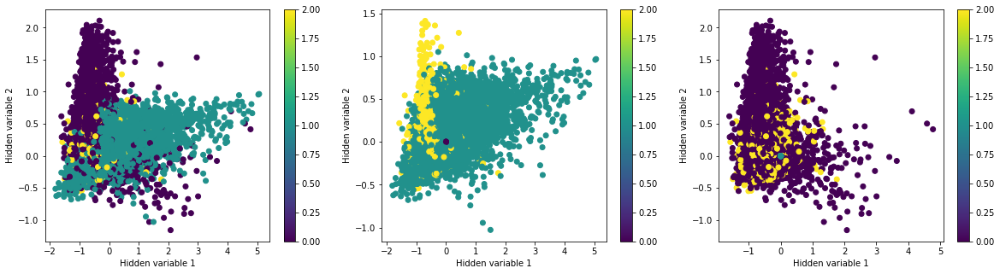

1019
0.905829103473


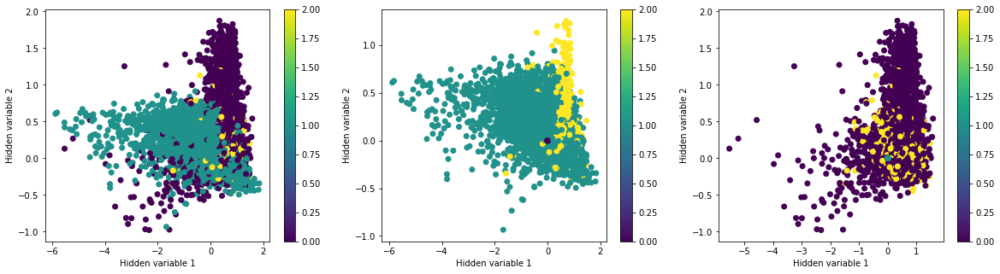

1019
0.904962424474


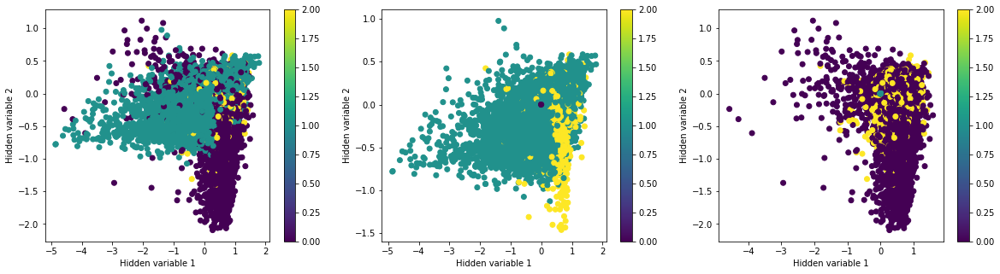

1019
0.904747090869


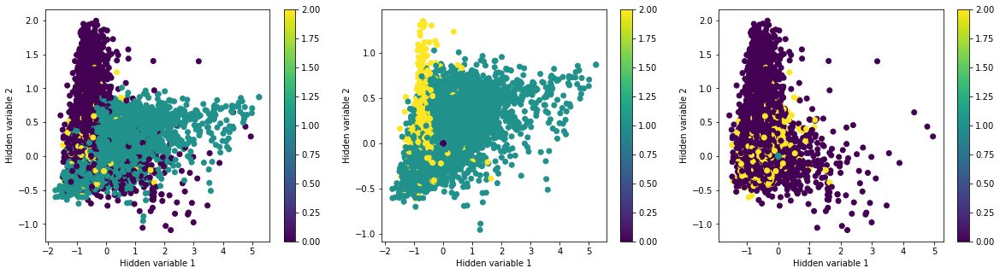

1019
0.903655963808


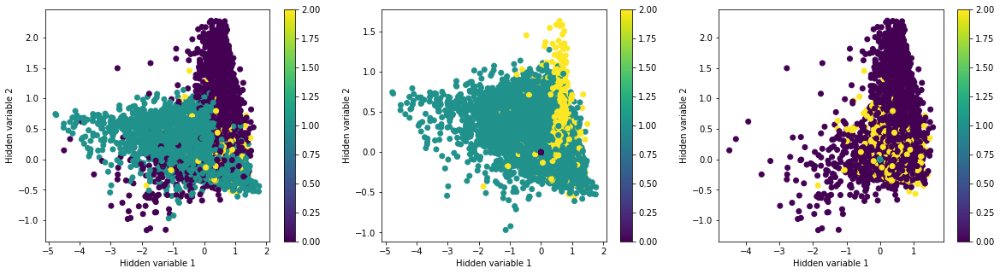

1019
0.898462740493


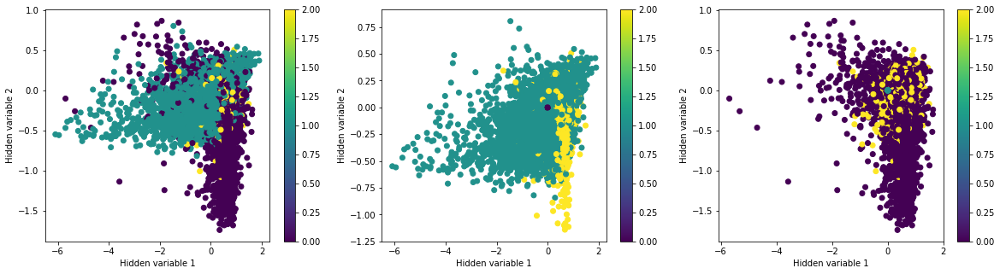

1019
0.903924853548


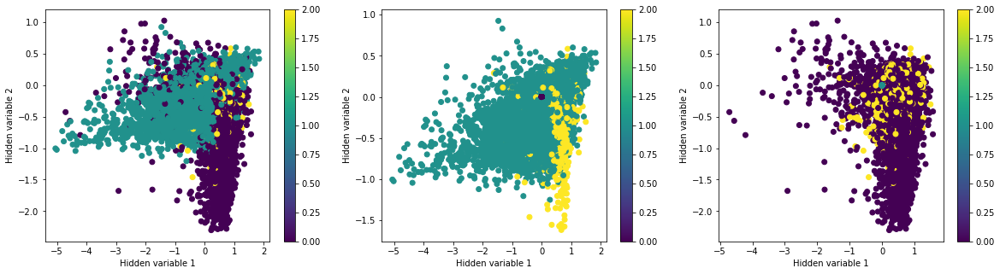

1019
0.905129263753


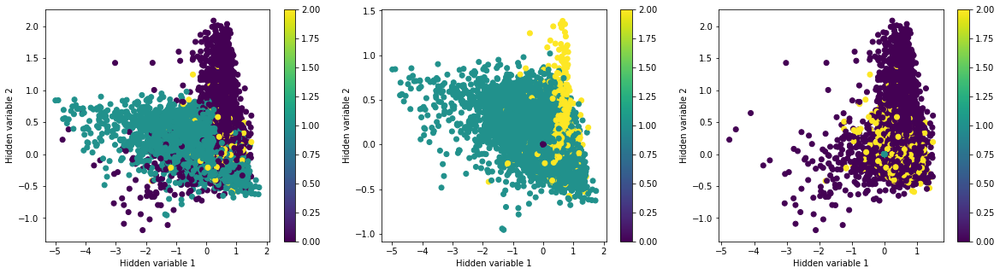

1019
0.903423275554


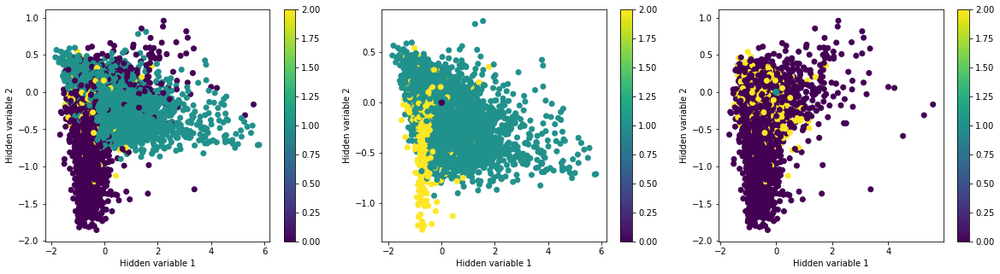

1019
0.90575805478


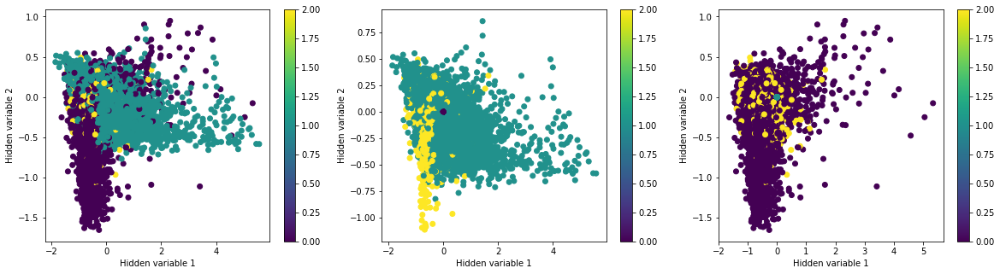

1019
0.90116439522


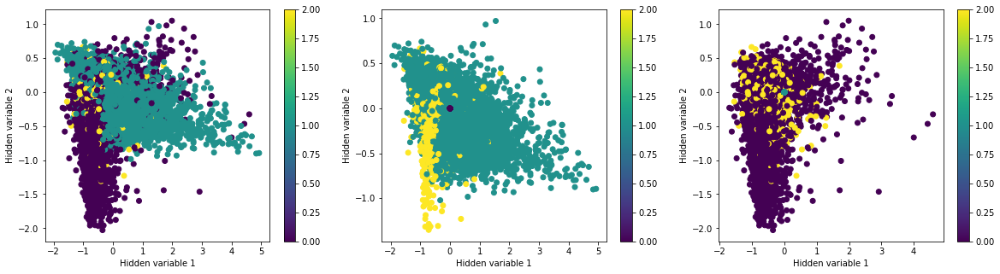

1019
0.906256778884


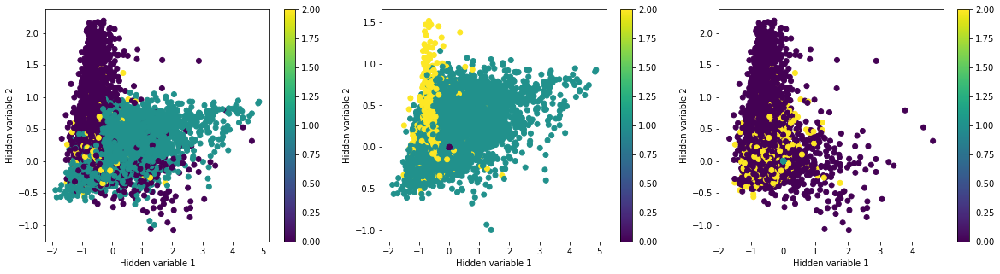

1019
0.903128257421


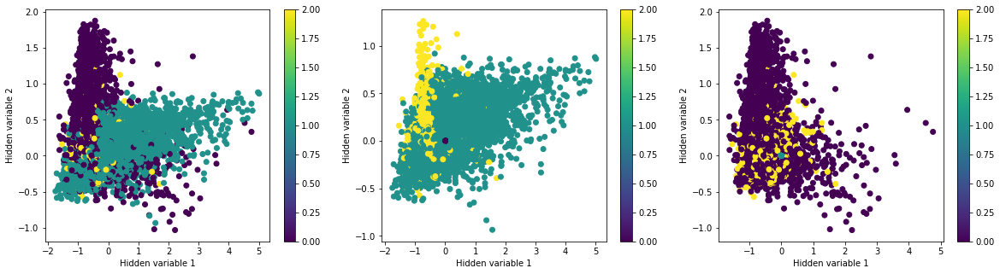

1019
0.901653465749


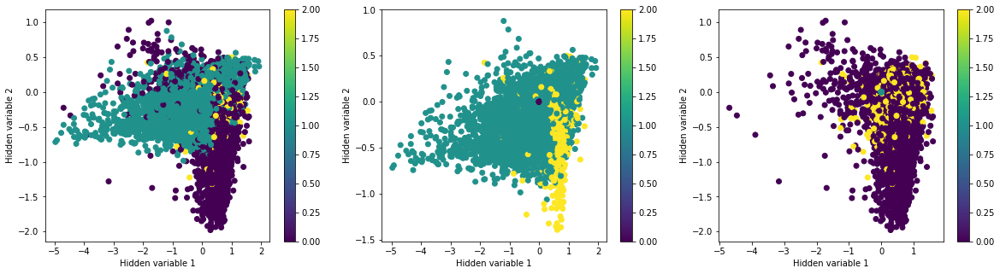

1019
0.899342773875


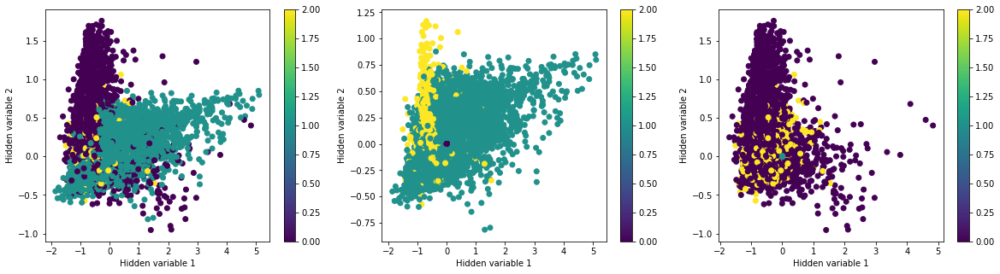

1019
0.90181756726


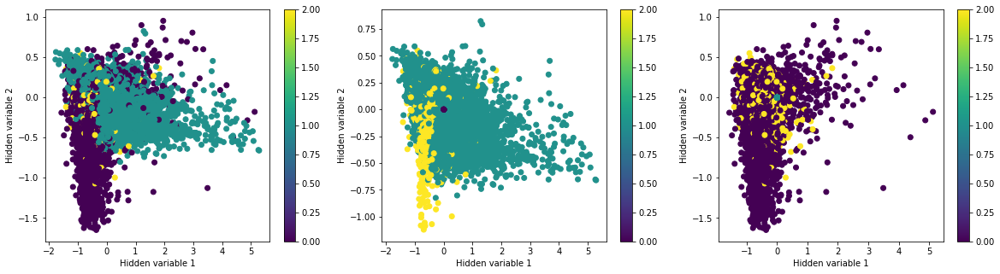

1019
0.904524868344


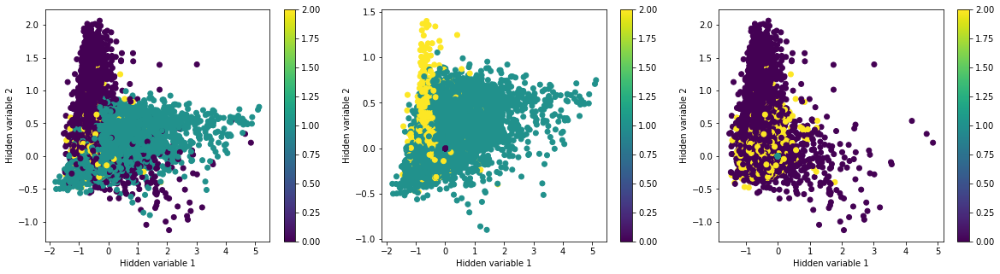

1019
0.902976869889


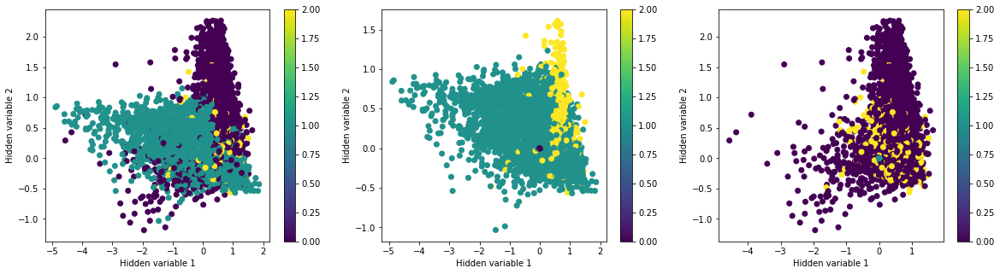

1019
0.899444536467


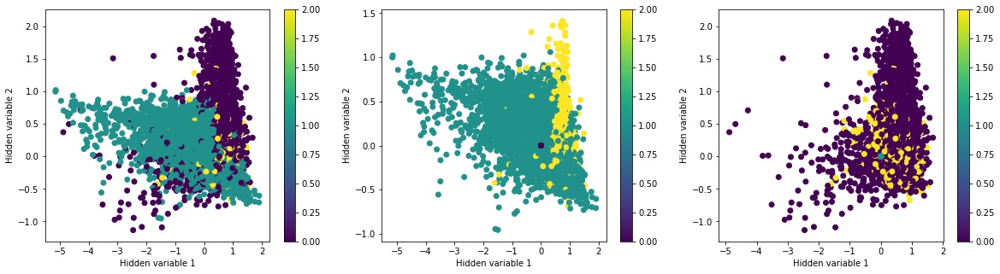

1019
0.904376096664


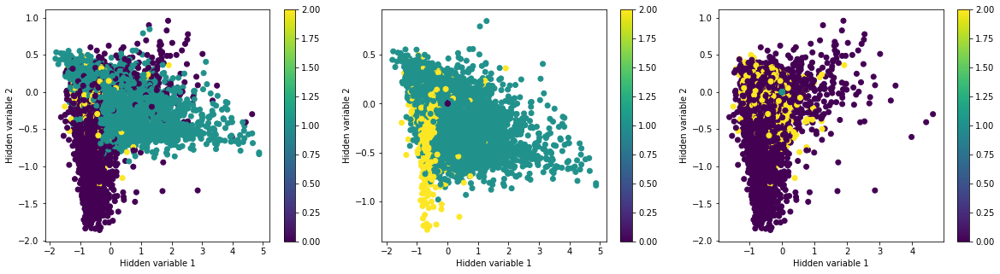

1019
0.902658019824


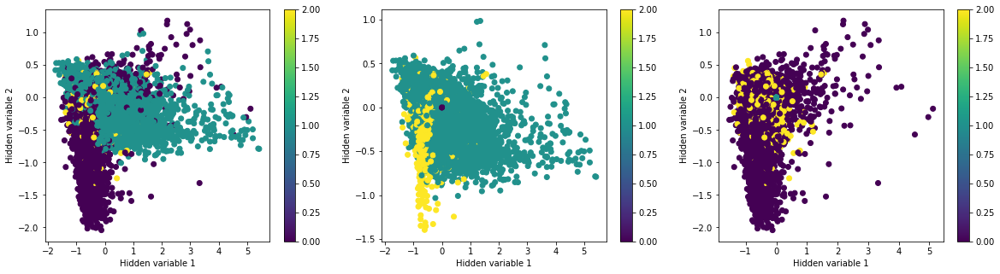

1019
0.904811319479


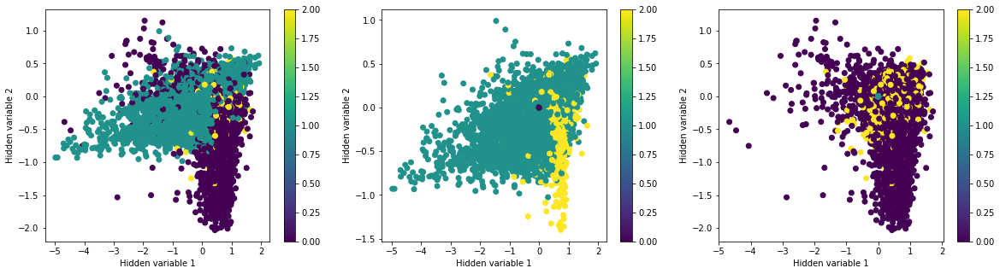

1019
0.904671118969


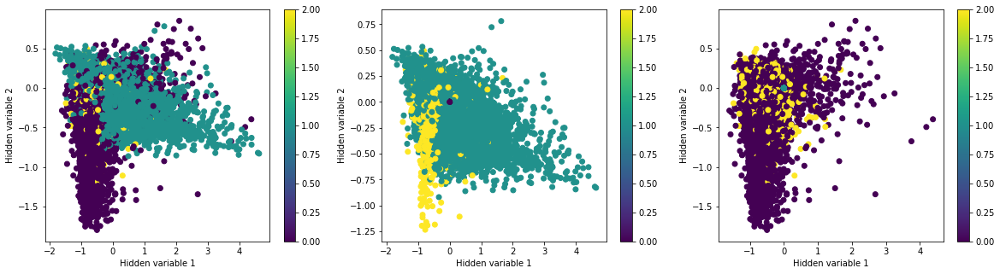

1019
0.904961317963


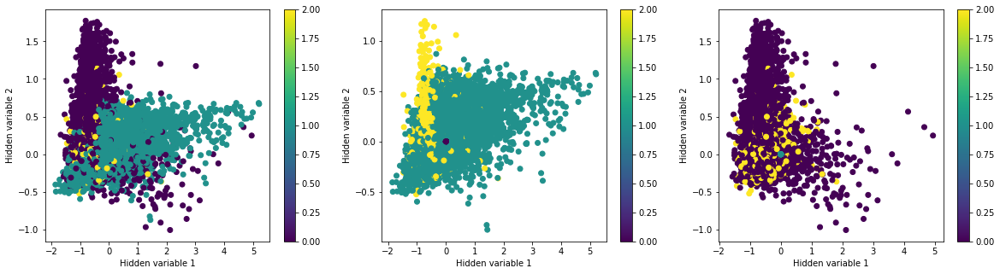

1019
0.900582645962


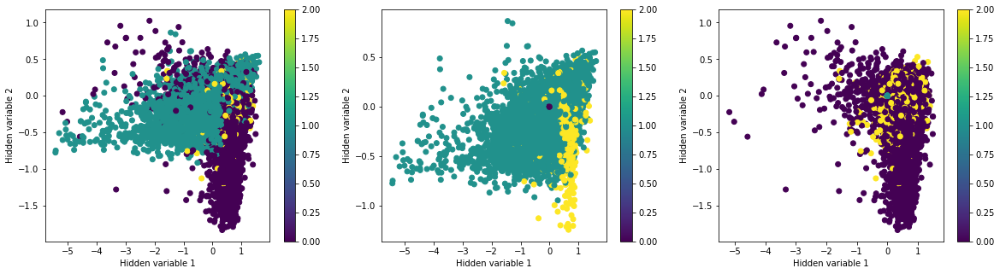

1019
0.906363699012


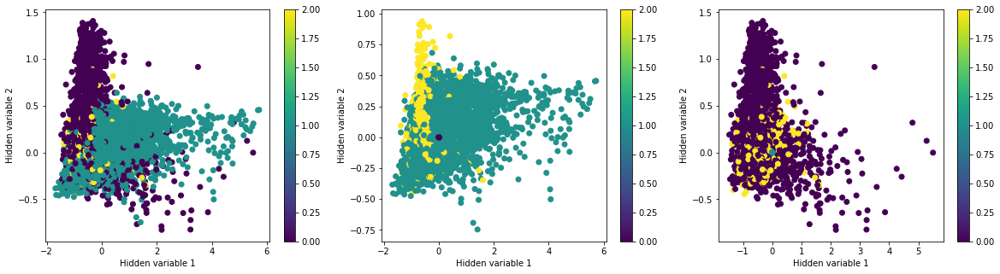

1019
0.900709549339


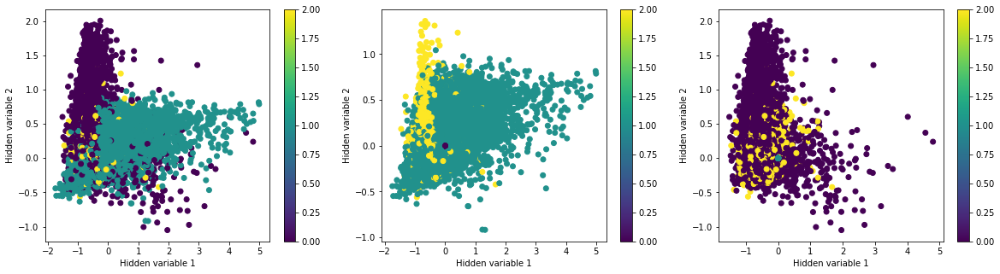

1019
0.901834901513


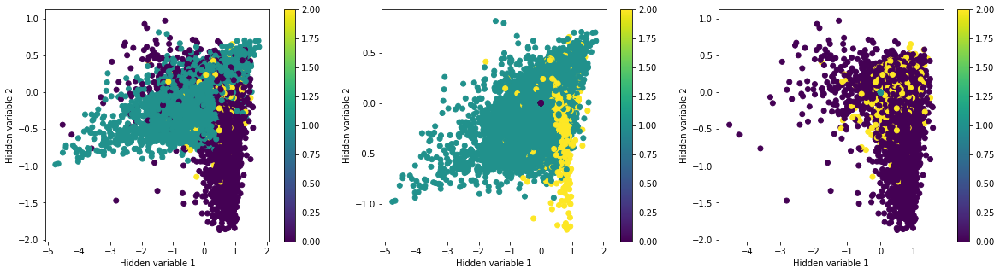

1019
0.90241151479


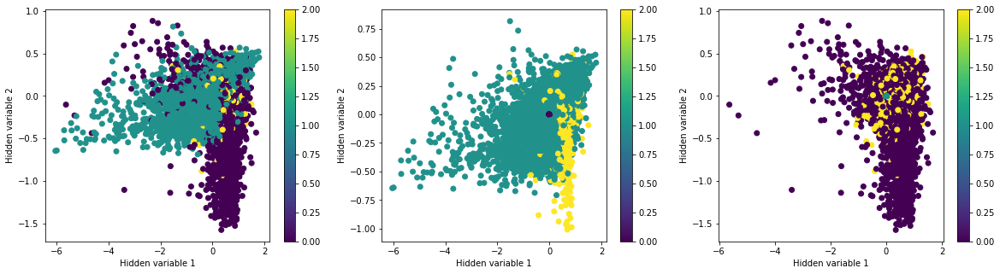

1019
0.903532149807


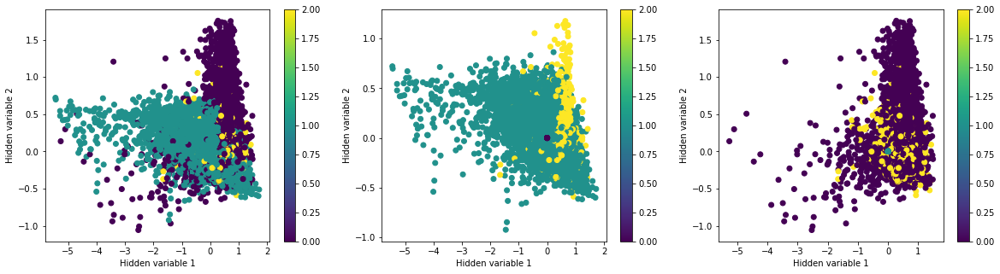

1019
0.903685218893


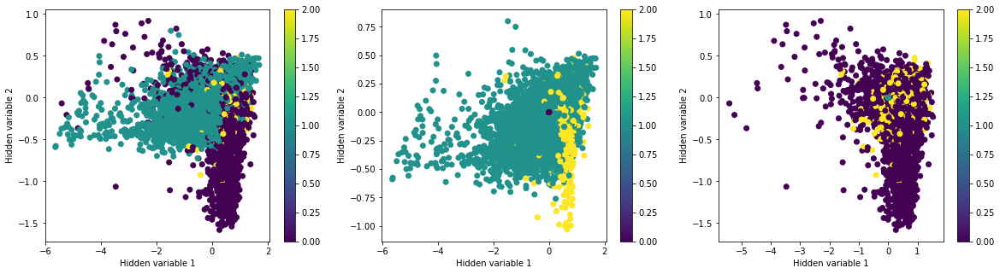

1019
0.90540848224


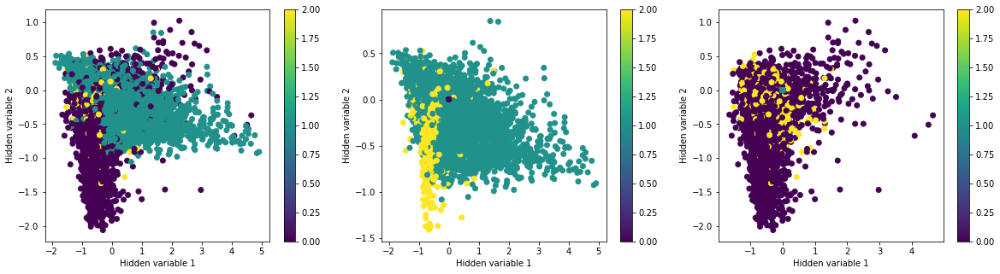

1019
0.906386052196


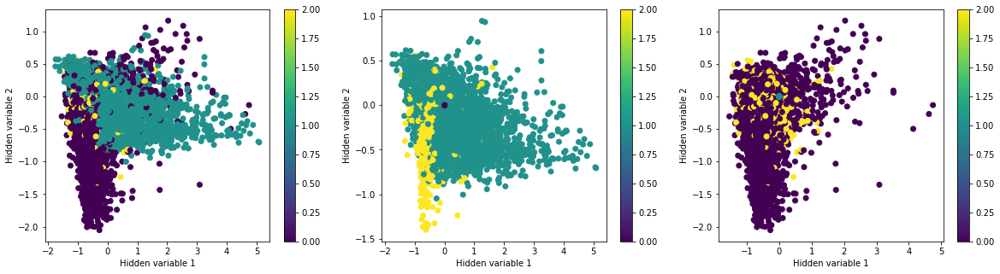

1019
0.901381576099


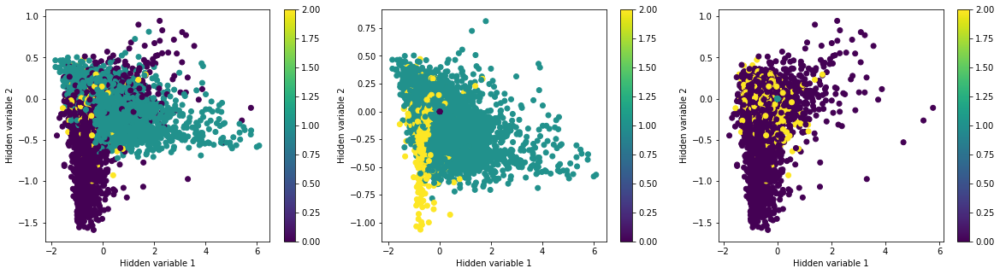

1019
0.905215713202


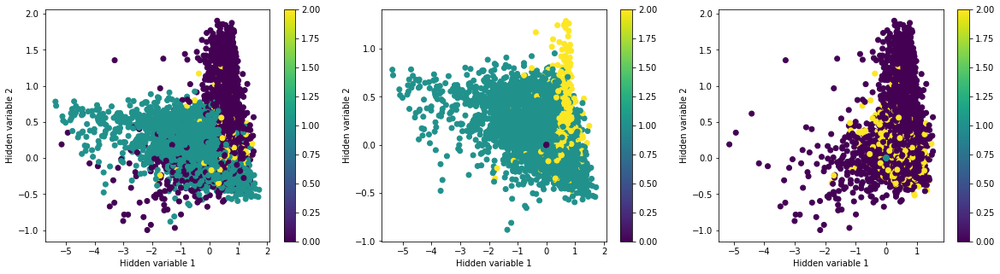

1019
0.901351155168


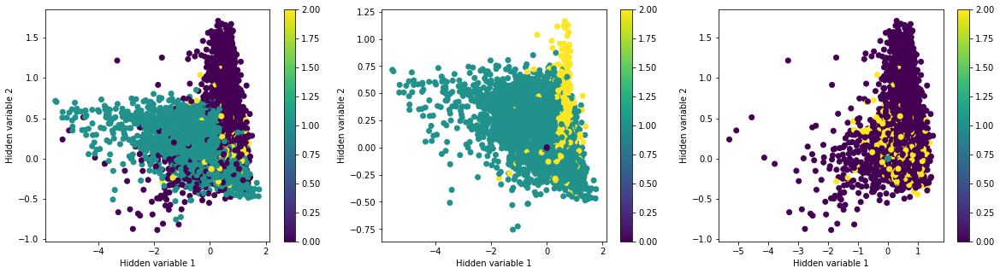

1019
0.899175679871


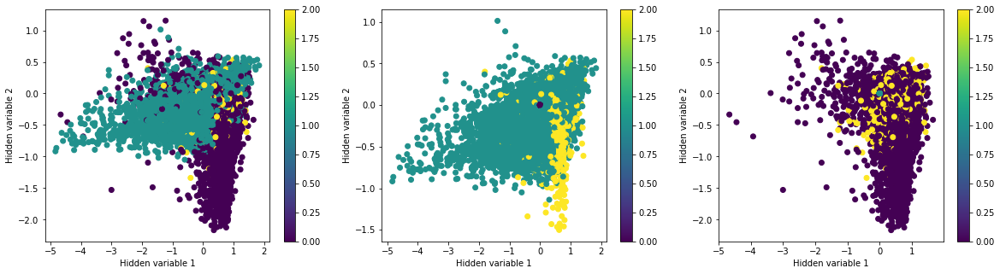

1019
0.899715538868


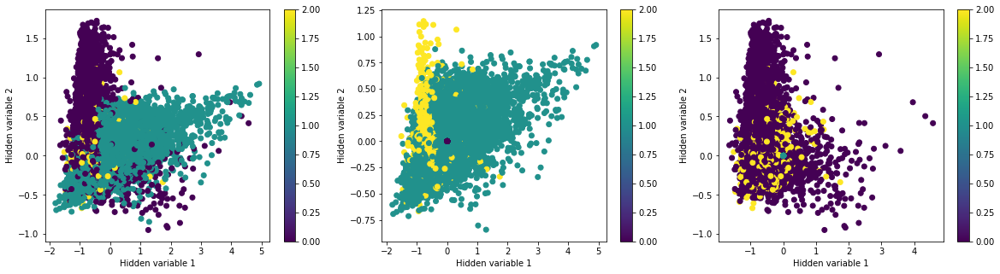

1019
0.905352381871


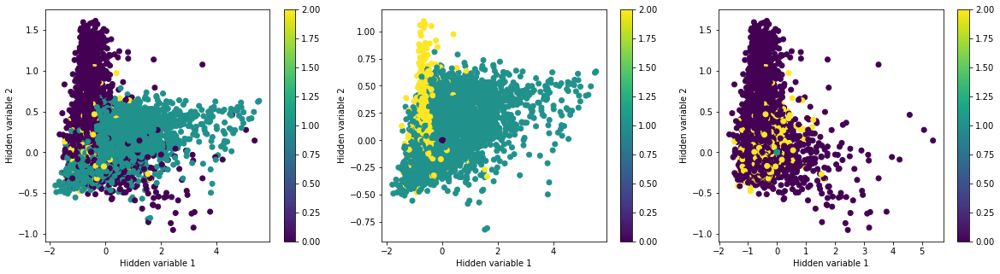

1019
0.900392695583


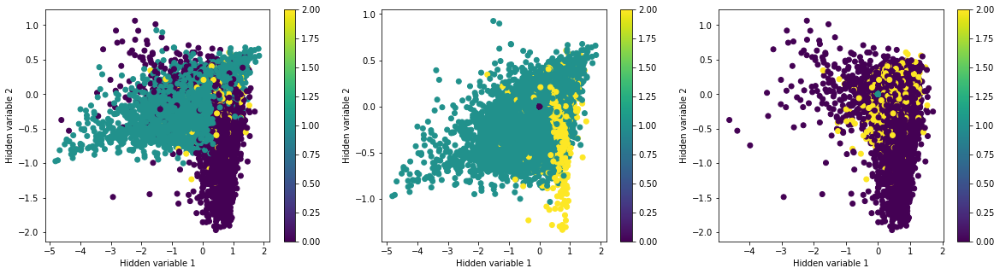

1019
0.904756846427


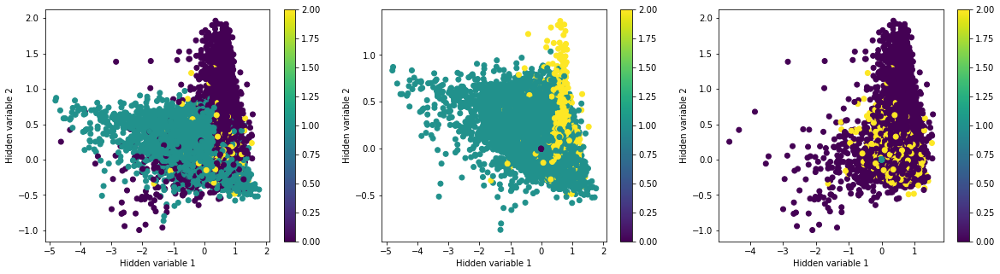

1019
0.899317759178


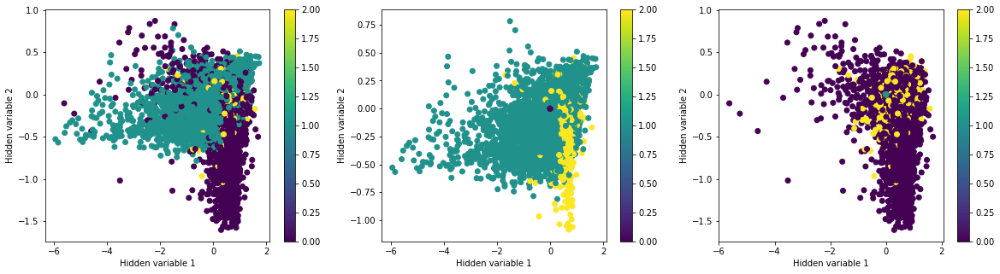

1019
0.903261371071


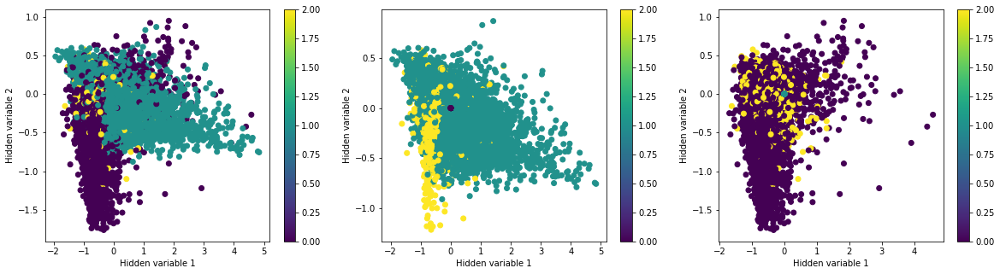

1019
0.90433820412


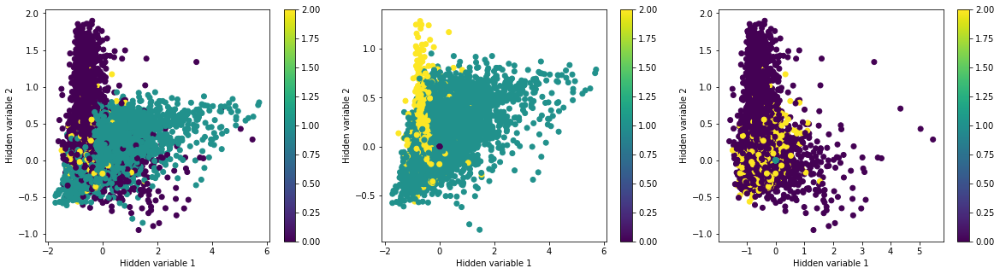

1019
0.904921369544


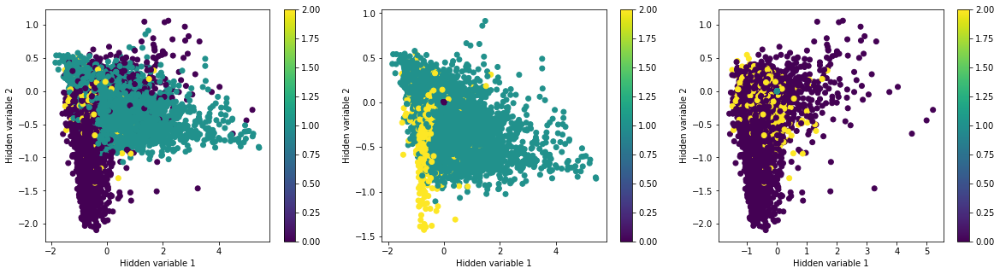

1019
0.905042554481


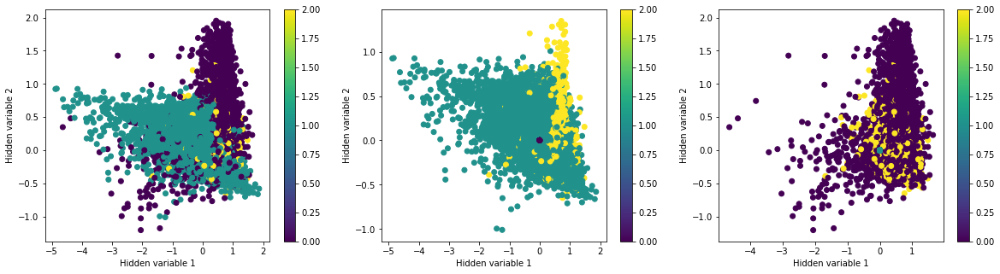

1019
0.900665455329


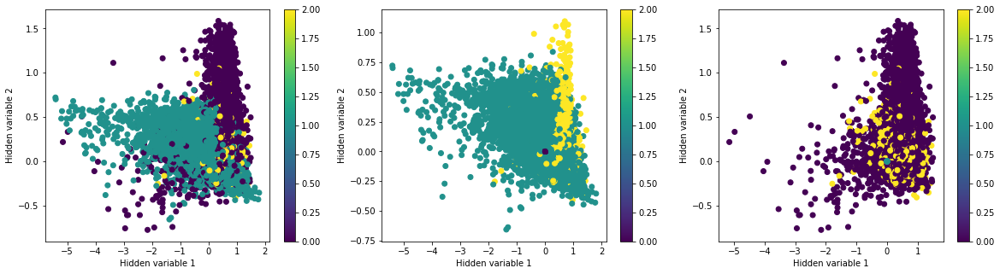

1019
0.907194927254


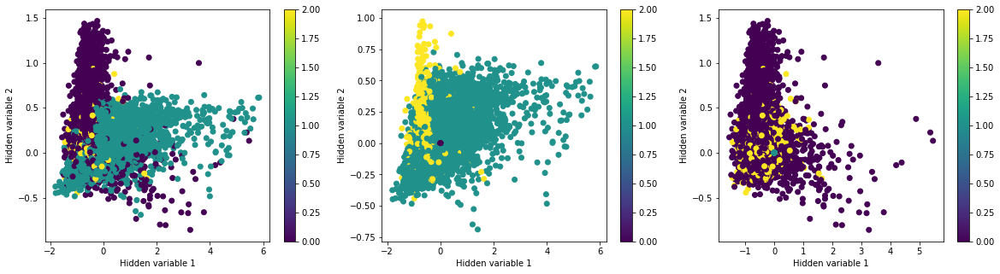

1019
0.90444486002


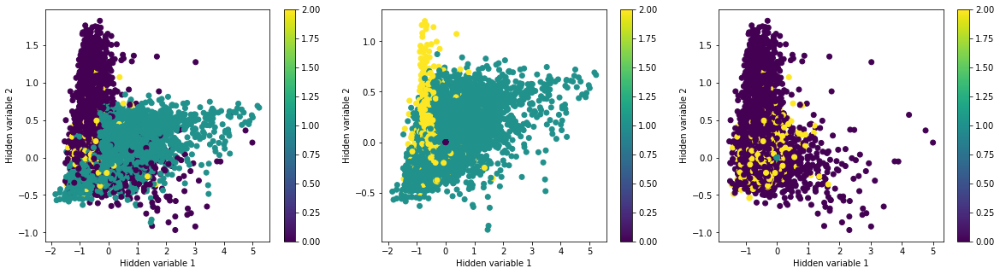

1019
0.904536888841


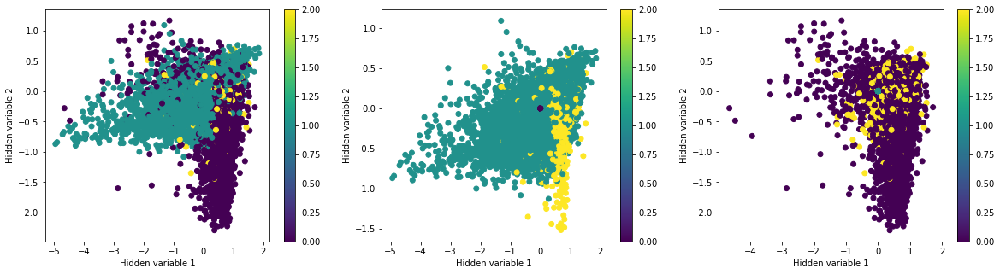

1019
0.903075511351


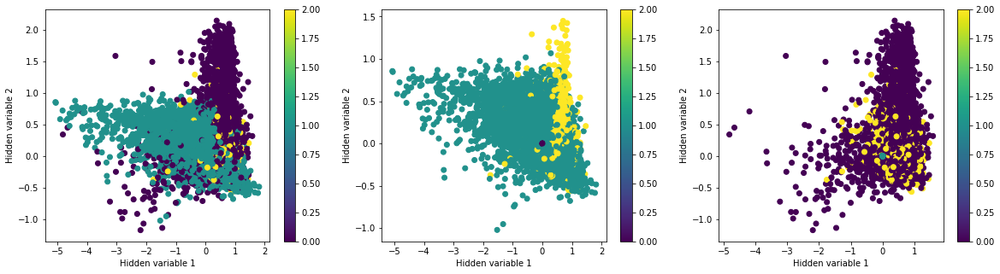

1019
0.904453849782


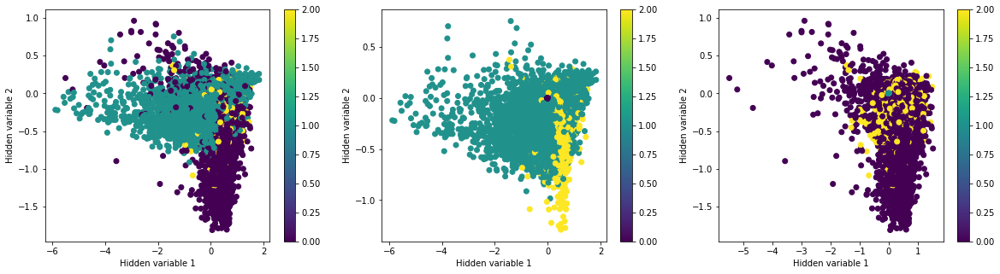

1019
0.896662456679


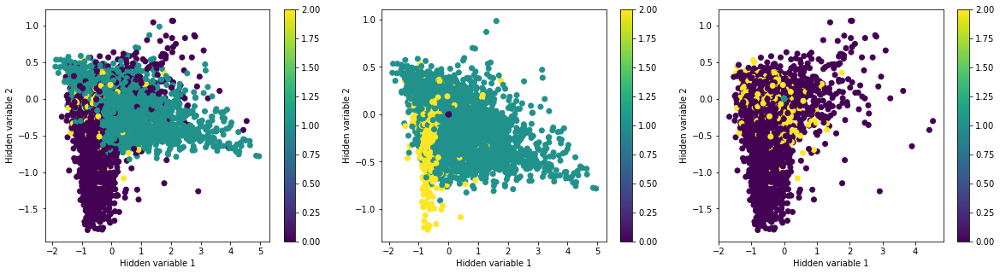

1019
0.904445468207


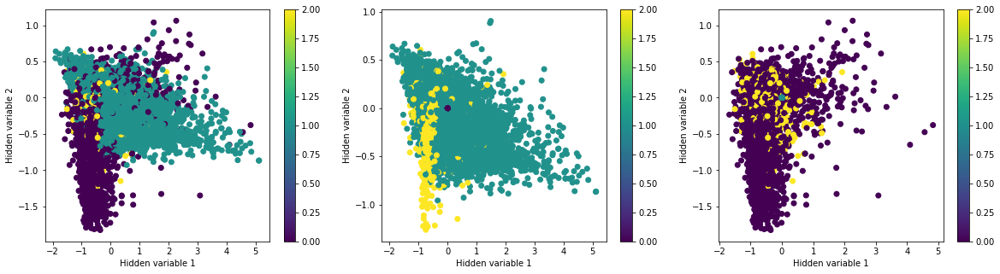

1019
0.902408810166


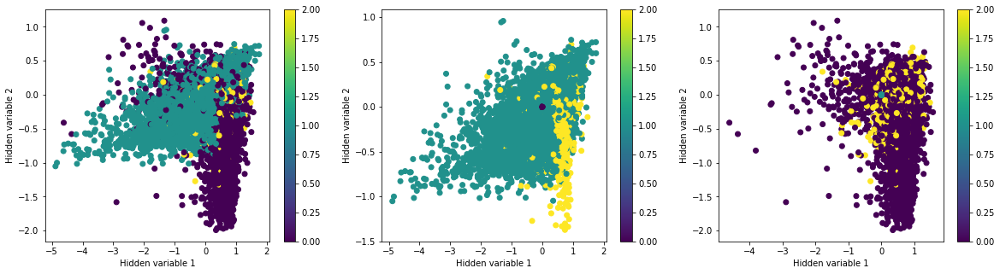

1019
0.902056846599


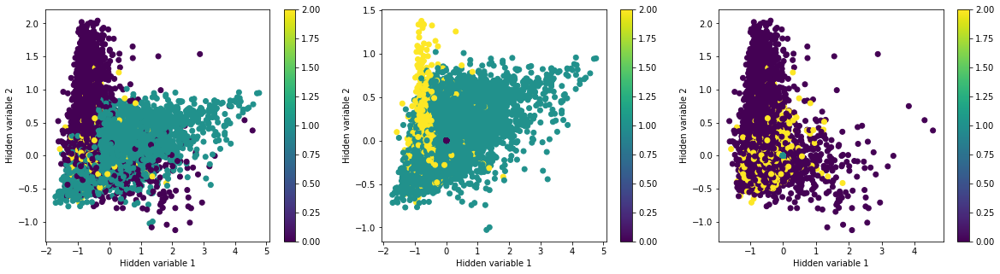

1019
0.905616867356


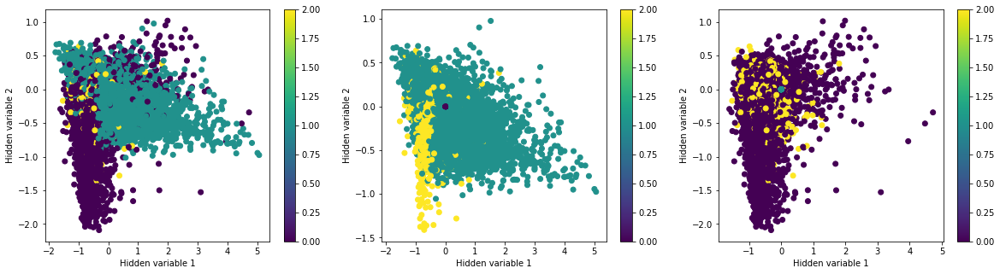

1019
0.906759822877


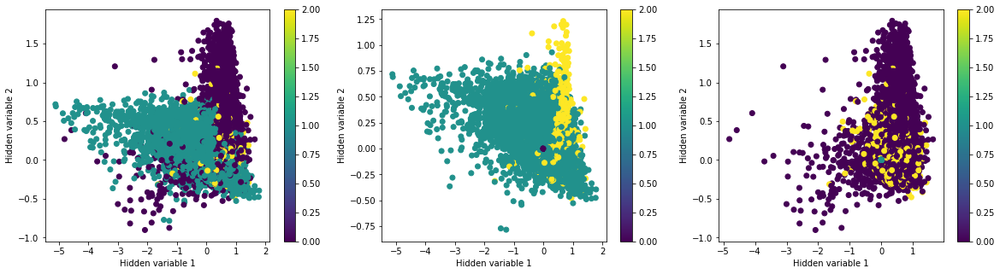

1019
0.903510230744


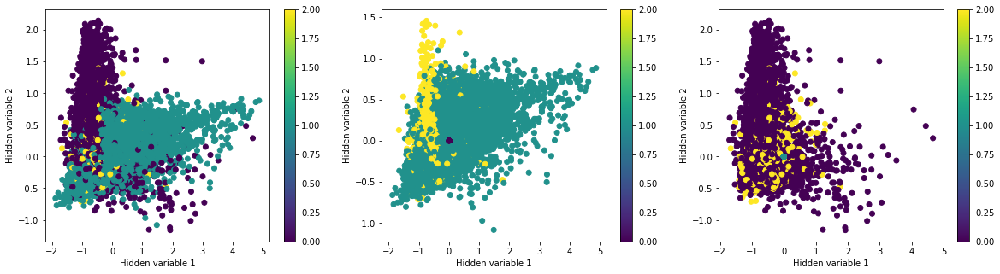

1019
0.902230825121


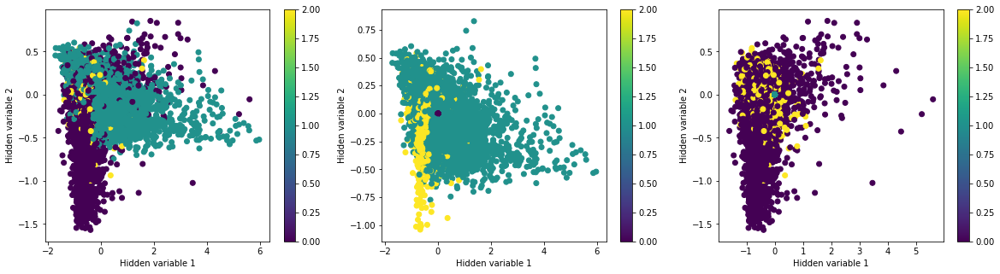

1019
0.902558455651


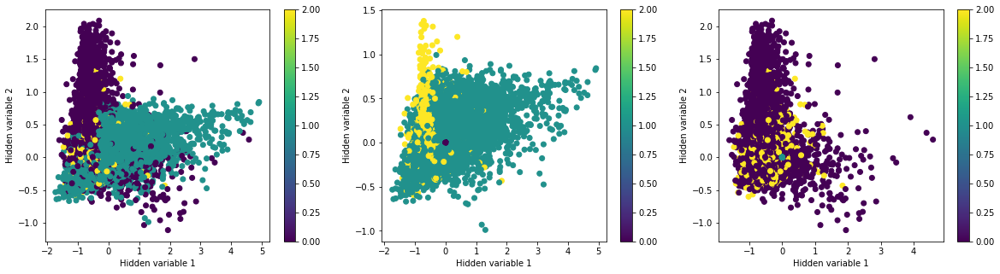

1019
0.901095986948


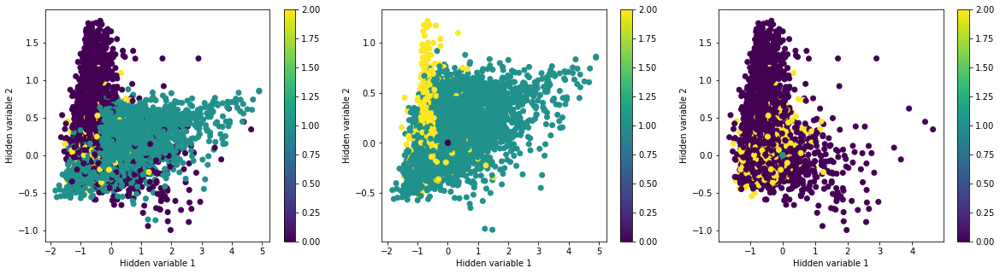

1019
0.899772341063


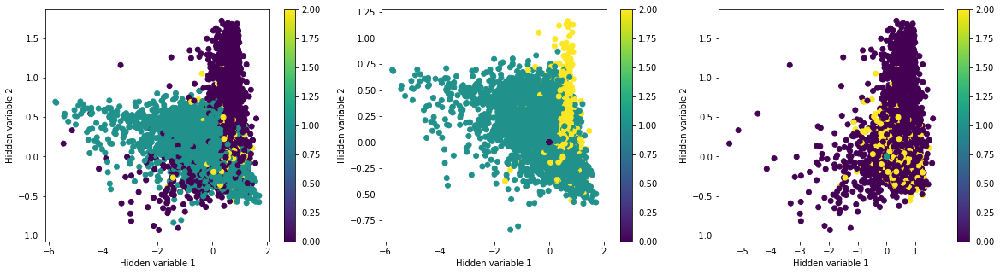

1019
0.904182757682


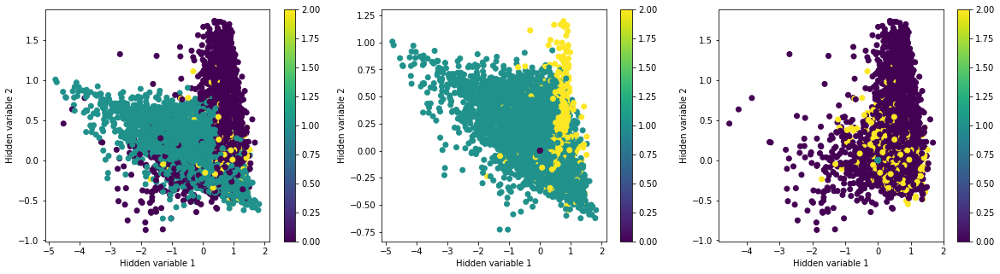

1019
0.90287747955


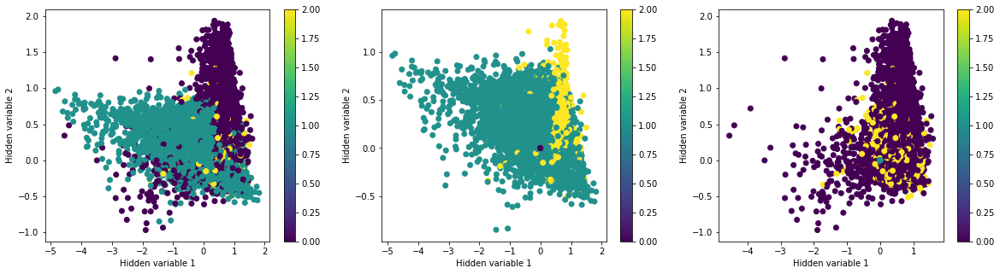

1019
0.901594034954


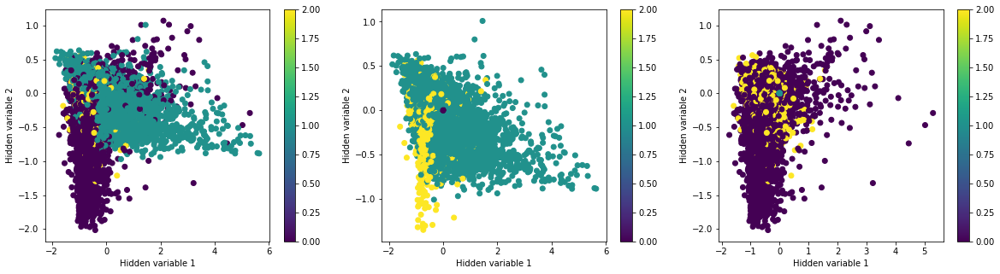

1019
0.904512551169


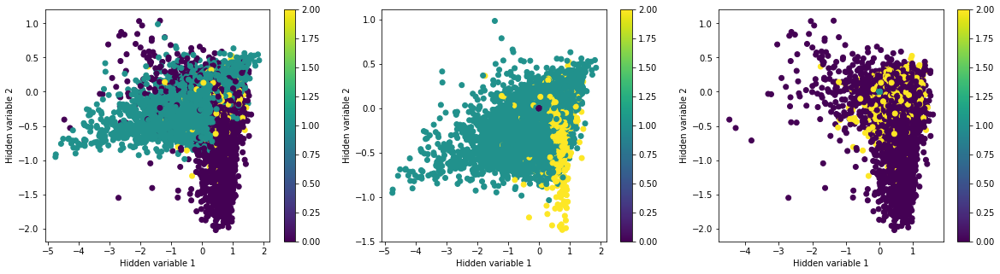

1019
0.903755021776


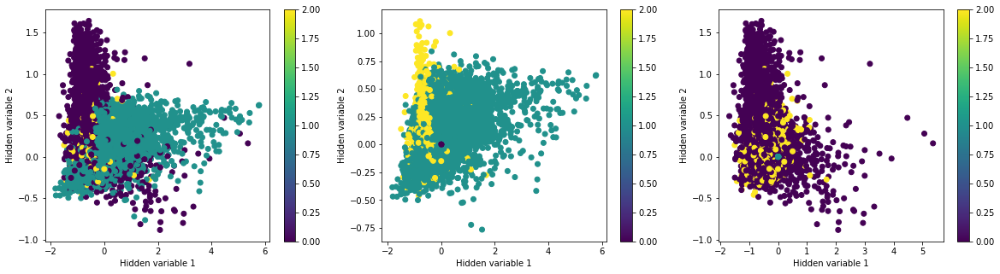

1019
0.901787500255


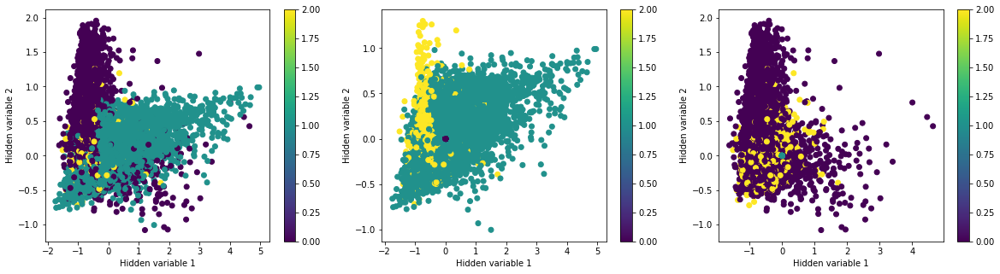

1019
0.904585397305


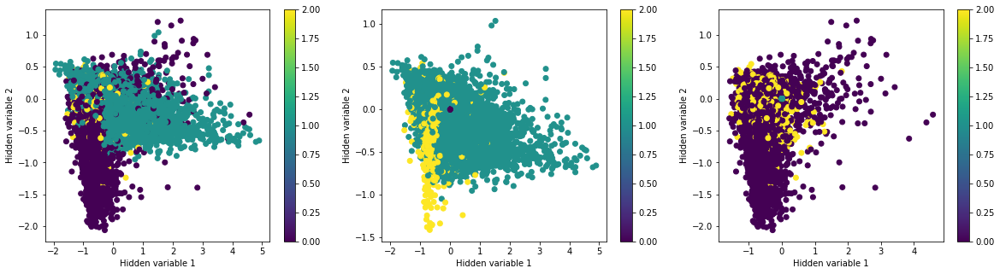

1019
0.899255693988


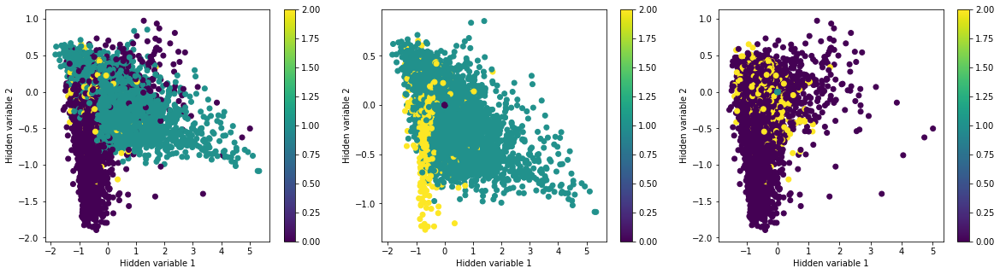

1019
0.899872725731


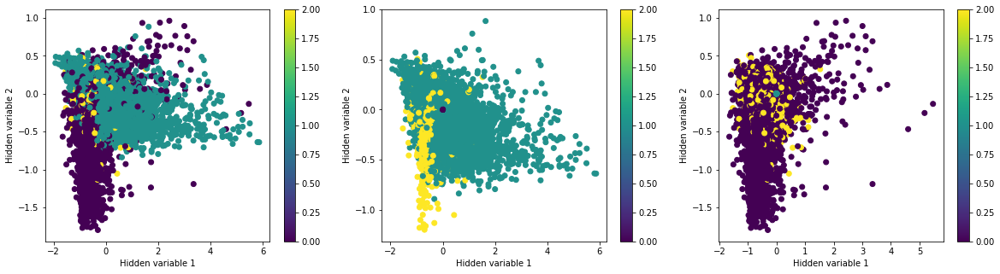

1019
0.903400735789


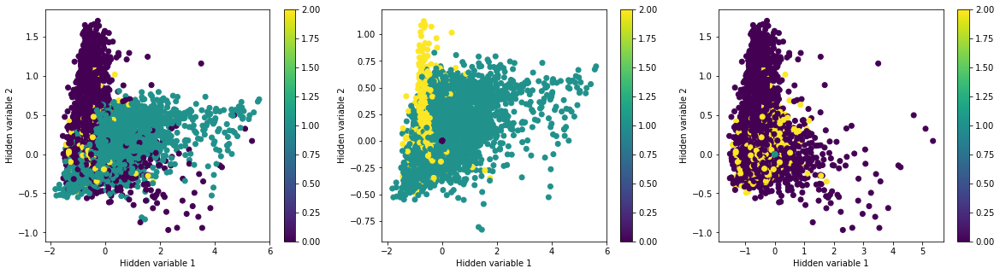

1019
0.902894815193


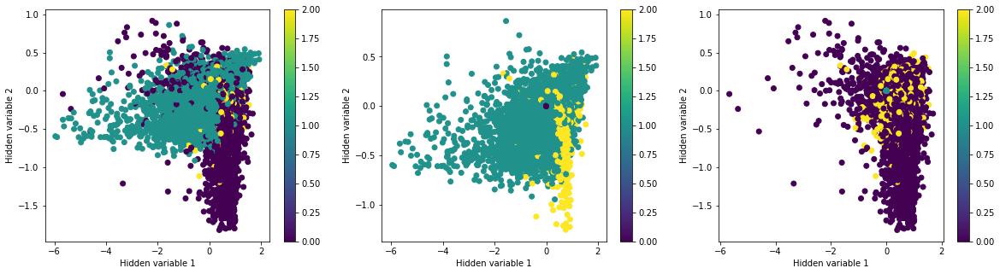

1019
0.905424248742


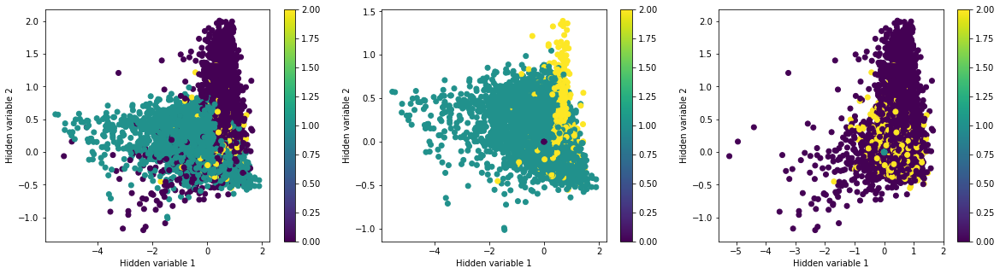

1019
0.902176304786


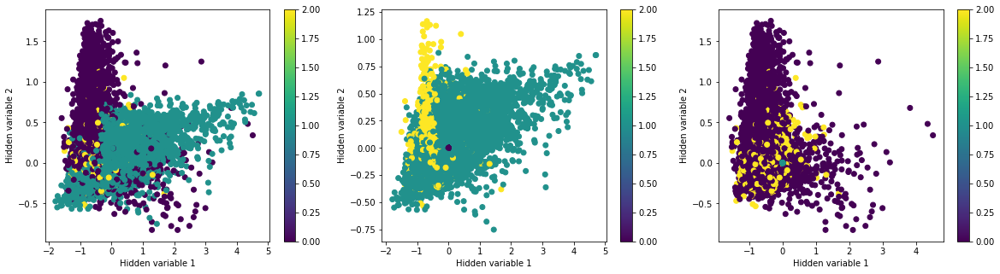

1019
0.902427417114


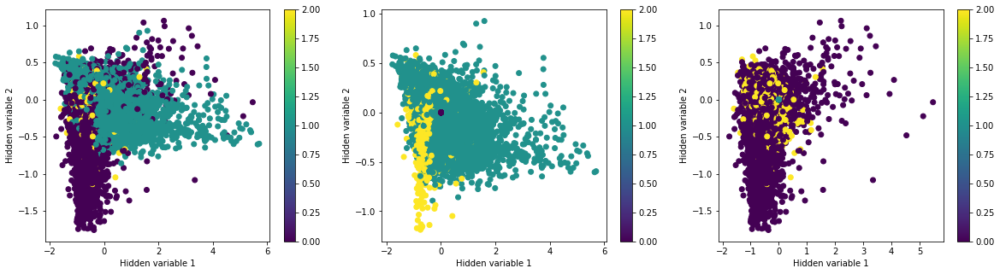

1019
0.904740853941


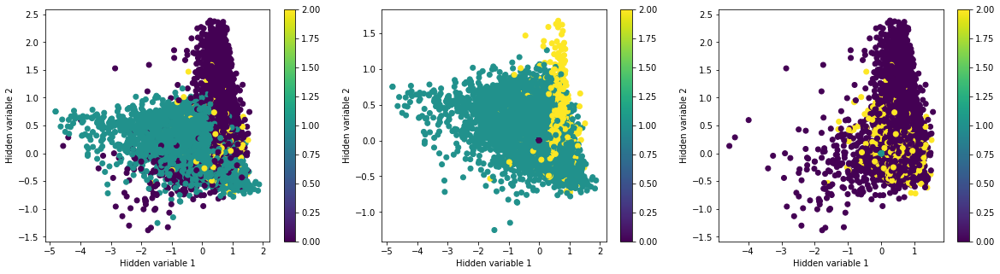

1019
0.90218091602


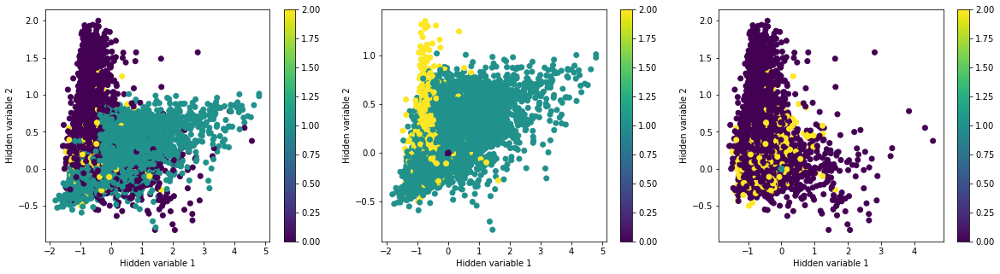

1019
0.903237909059


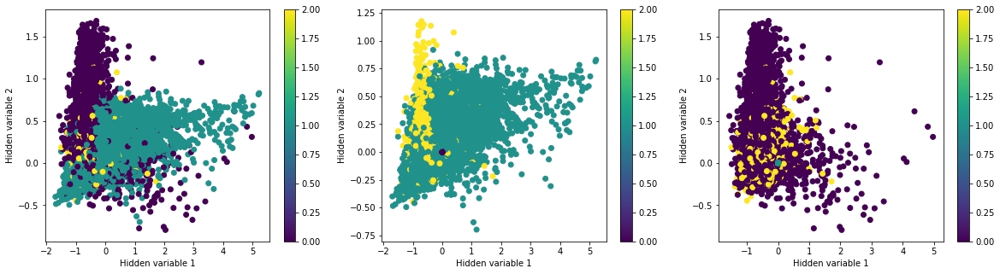

1019
0.904948945162


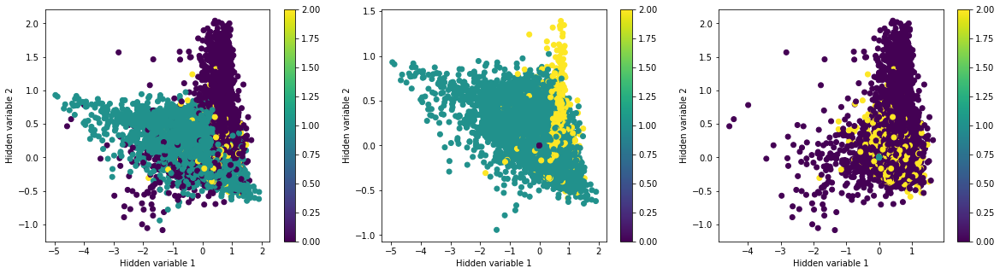

1019
0.900492439615


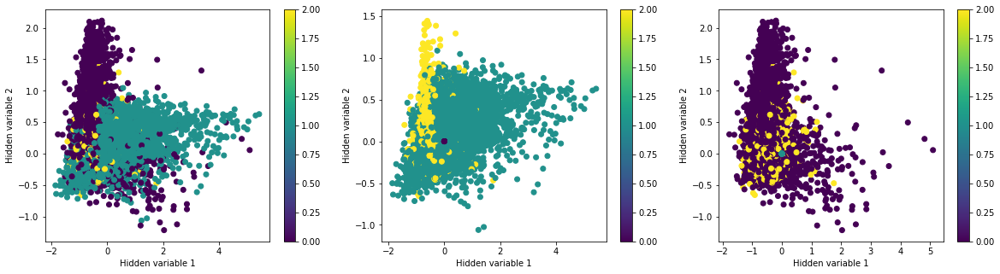

1019
0.901382827935


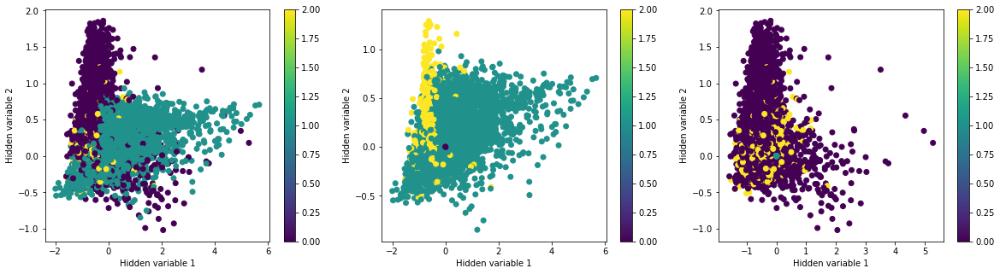

1019
0.902688276656


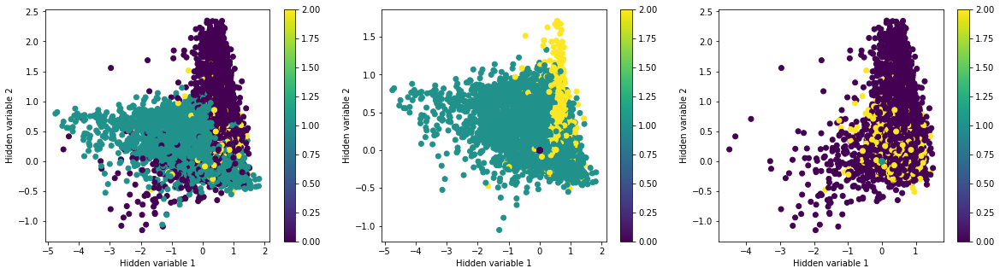

1019
0.899073613649


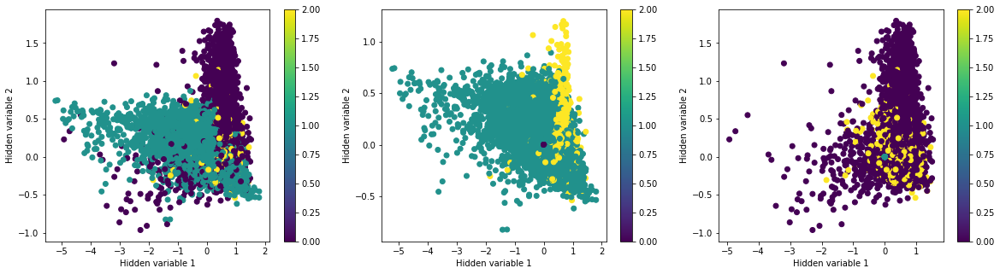

1019
0.90513783446


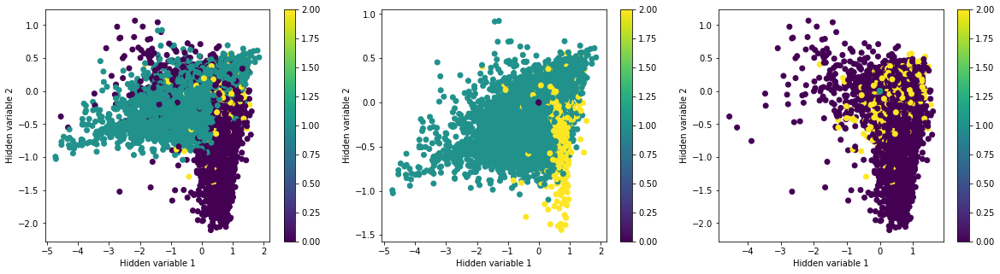

1019
0.907519445231


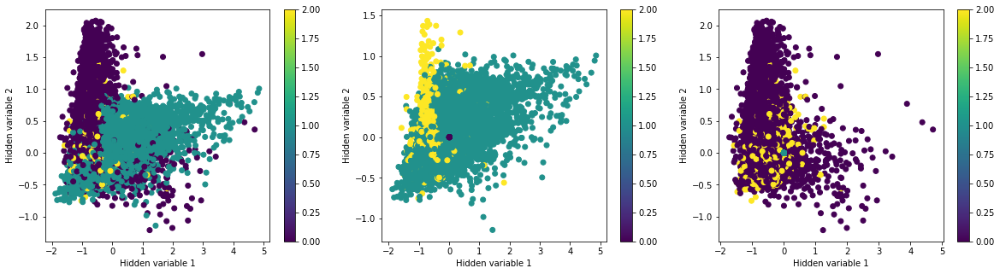

1019
0.903123859192


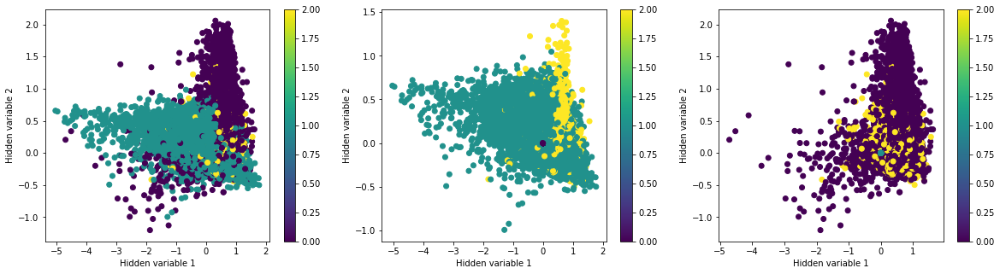

1019
0.898584880589


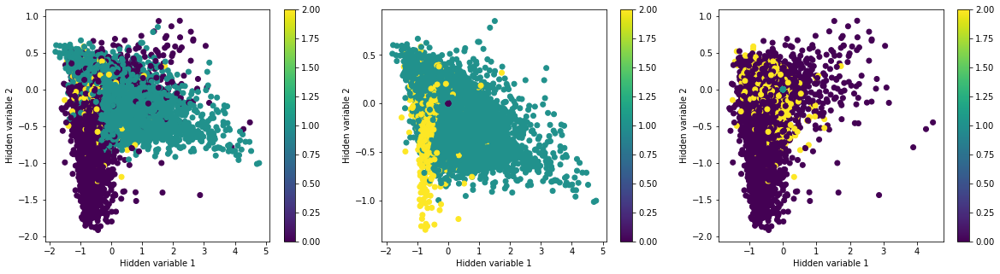

1019
0.906854737341


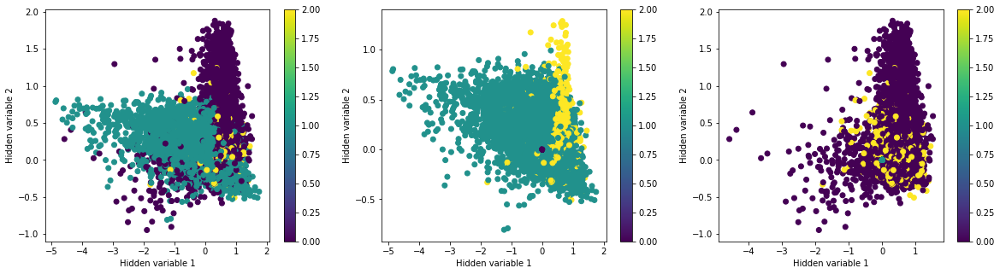

1019
0.905027037141


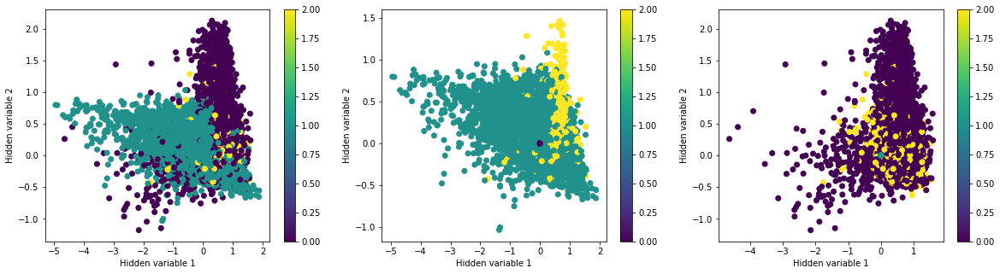

1019
0.900641361256


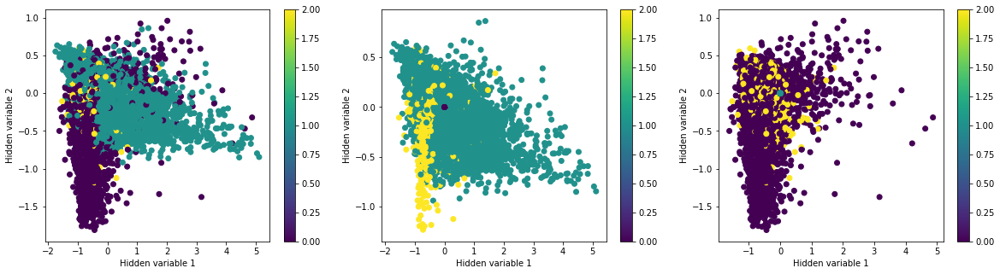

1019
0.899625936768


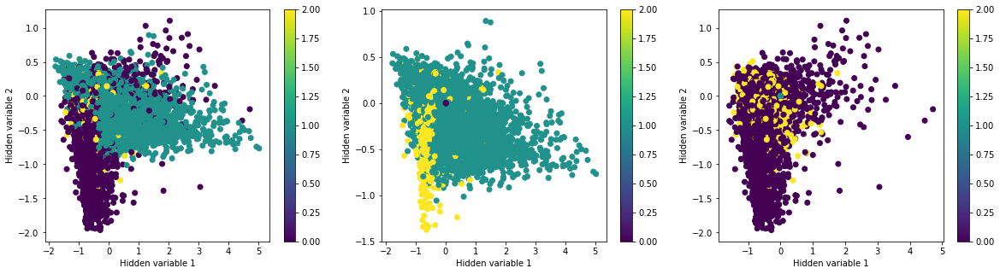

1019
0.899675367015


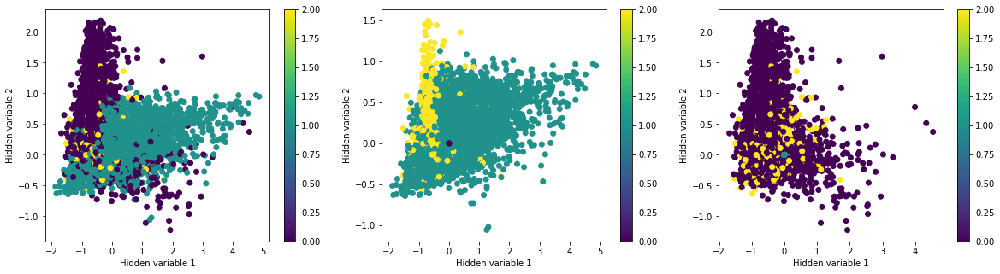

1019
0.904392143154


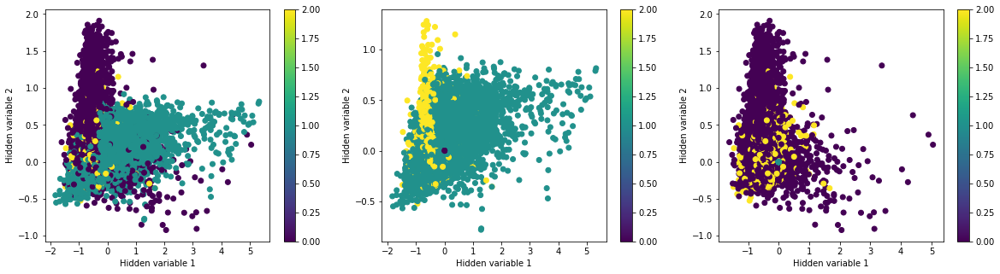

1019
0.902217068602


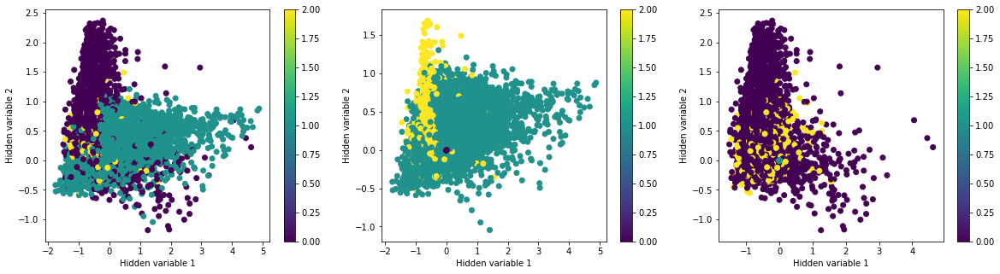

1019
0.900484220981


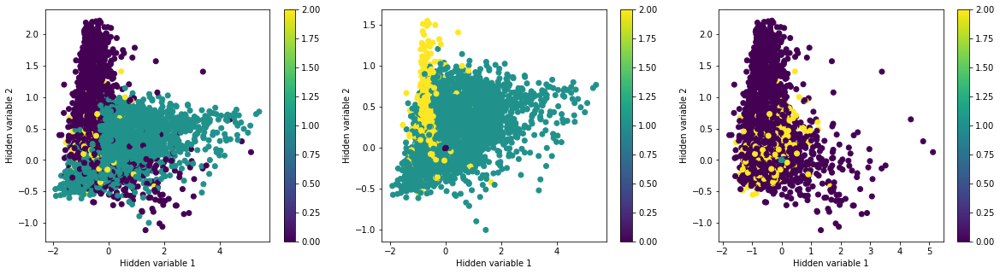

1019
0.905902961089


In [9]:
AUC = np.zeros((100,))

for xunhuan in range(100):
    """VAE"""
    net_3_input= Input(shape=(30,))
    h_1 = Dense(30, activation='tanh')(net_3_input)

    z_mean = Dense(1)(h_1)
    z_log_var = Dense(1)(h_1)
    z_mean_2 = Dense(1)(h_1)
    z_log_var_2 = Dense(1)(h_1)
    z_mean_con = Concatenate()([z_mean,z_mean_2])
    def sampling1d(args):   
        z_mean, z_log_var = args  
        epsilon = K.random_normal(shape=(100, 1), mean=0.,stddev=0.1)
        return z_mean + K.exp(z_log_var / 2)* epsilon
    def sampling5d(args):   
        z_mean, z_log_var = args  
        epsilon = K.random_normal(shape=(100, 1), mean=0.,stddev=0.1)
        return z_mean + K.exp(z_log_var / 2)* epsilon
    
    z = Lambda(sampling1d, output_shape=(1,))([z_mean, z_log_var])
    z_2 = Lambda(sampling5d, output_shape=(1,))([z_mean_2, z_log_var_2])
    z_con = Concatenate()([z,z_2])
    decoded = Dense(30, activation='tanh')(z_con)

    def vae_loss(x, decoded):
        xent_loss = K.sum((objectives.mse(x ,decoded)),axis=-1)
        #kl_loss_d1 = - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1) 
        m = K.constant(0)
        s = K.constant(1)
        #kl_loss_d1 = K.sum(K.log(2/K.exp(z_log_var/2))+(K.square(z_mean)+(K.exp(z_log_var/2)-K.constant(1))*(K.exp(z_log_var/2)+K.constant(1)))/(K.constant(2)),axis = -1)
        kl_loss_d1 = K.sum(K.log(2*s/K.exp(z_log_var/2))+(K.constant(2)*m*(-K.exp(-(K.square(z_mean))/((K.constant(2))*K.exp(z_log_var)))*K.exp(z_log_var/2) + K.sqrt(K.constant(np.pi/2))*z_mean*(K.constant(1)-K.tanh(K.constant(1.19)*z_mean/K.constant(np.sqrt(2))/K.exp(z_log_var/2)))) )/(K.square(s))+(K.square(m-z_mean)+(K.exp(z_log_var/2)-s)*(K.exp(z_log_var/2)+s))/(K.constant(2)*K.square(s)),axis = -1)
        return 1*xent_loss + 0.2*kl_loss_d1 
    EarlyStopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto')
    vae = Model(input=net_3_input, output=decoded)
    vae.compile(optimizer='rmsprop', loss=vae_loss)

    vae.fit(Zero_one_normalized_encoded_variables[:100000], Zero_one_normalized_encoded_variables[:100000],
        shuffle=True,
        epochs=100,
        verbose=0,
        batch_size=batch_size,
        validation_split=0.2,callbacks=[EarlyStopping])
    vis = Model(input=net_3_input, output=z_mean_con)

    # display a 2D plot of the digit classes in the latent space  
    # x_vis = vis.predict(Zero_one_normalized_encoded_variables[lower_lim:upper_lim], batch_size=batch_size)

    test_encoded_variables = encoder.predict(test_Image_RGB[:100000],batch_size=100)
    vis = Model(input=net_3_input, output=z_mean_con)
    x_vis = vis.predict(test_encoded_variables[:100000], batch_size=batch_size)

    x_vis_1 = vis.predict(test_encoded_variables[:100000], batch_size=batch_size)  
    x_vis_1[Class[:100000]<1]=0

    x_vis_2 = vis.predict(test_encoded_variables[:100000], batch_size=batch_size)  
    x_vis_2[Class[:100000]==1]=0


    plt.figure(figsize=(20, 5))
    ax = plt.subplot(1,3,1)
    plt.scatter( x_vis[:, 0] ,x_vis[:, 1],c=Class[:100000])
    plt.colorbar()
    plt.xlabel("Hidden variable 1")
    plt.ylabel("Hidden variable 2")
    ax = plt.subplot(1,3,2)
    plt.scatter( x_vis_1[:, 0] ,x_vis_1[:, 1],c=Class[:100000])
    plt.colorbar()
    plt.xlabel("Hidden variable 1")
    plt.ylabel("Hidden variable 2")
    ax = plt.subplot(1,3,3)
    plt.scatter( x_vis_2[:, 0] ,x_vis_2[:, 1],c=Class[:100000])
    plt.colorbar()
    plt.xlabel("Hidden variable 1")
    plt.ylabel("Hidden variable 2")
    plt.show()
    
    lower_lim = 0
    upper_lim=100000
    
    Y_pred = x_vis[:,0]
    thr_min = -5.1
    thr_max = 5.1
    test_accuracy = 0.01
    test_range = int((thr_max - thr_min)/test_accuracy)
    print(test_range)
    FP = []
    TP = []
    TN = []
    FN = []
    TA = np.ones((Y_pred.shape[0],))
    TA[Class[lower_lim:upper_lim] ==0 ] = 0
    TA[Class[lower_lim:upper_lim] ==2 ] = 0

    for i in range(test_range):
        FP_temp = np.zeros((Y_pred.shape[0]))
        TP_temp = np.zeros((Y_pred.shape[0]))
        TN_temp = np.zeros((Y_pred.shape[0]))
        FN_temp = np.zeros((Y_pred.shape[0]))
        LA = np.zeros((Y_pred.shape[0],))
        thr_now = thr_min+ i*test_accuracy
        LA[Y_pred[:] > thr_now] = 1
        for j in range(Y_pred.shape[0]):
            if LA[j]==0:
                if TA[j]==1:
                    FN_temp[j] = 1
                else:
                    TN_temp[j] = 1
            else:
                if TA[j] == 1:
                    TP_temp[j] = 1
                else:
                    FP_temp[j] = 1
        FP.append(FP_temp)
        TP.append(TP_temp)
        TN.append(TN_temp)
        FN.append(FN_temp)

    TPR = np.zeros((test_range,))
    FPR = np.zeros((test_range,))
    TPR = np.sum(TP,axis=-1)/(np.sum(TP,axis=-1)+np.sum(FN,axis=-1))
    FPR = np.sum(FP,axis=-1)/(np.sum(FP,axis=-1)+np.sum(TN,axis=-1))

    AUC[xunhuan] = np.max([np.max([metrics.auc(FPR, TPR),1-metrics.auc(FPR, TPR)]),AUC[xunhuan]])
    print(AUC[xunhuan])

In [10]:
AUC

array([ 0.90274858,  0.90439766,  0.90271981,  0.9058291 ,  0.90496242,
        0.90474709,  0.90365596,  0.89846274,  0.90392485,  0.90512926,
        0.90342328,  0.90575805,  0.9011644 ,  0.90625678,  0.90312826,
        0.90165347,  0.89934277,  0.90181757,  0.90452487,  0.90297687,
        0.89944454,  0.9043761 ,  0.90265802,  0.90481132,  0.90467112,
        0.90496132,  0.90058265,  0.9063637 ,  0.90070955,  0.9018349 ,
        0.90241151,  0.90353215,  0.90368522,  0.90540848,  0.90638605,
        0.90138158,  0.90521571,  0.90135116,  0.89917568,  0.89971554,
        0.90535238,  0.9003927 ,  0.90475685,  0.89931776,  0.90326137,
        0.9043382 ,  0.90492137,  0.90504255,  0.90066546,  0.90719493,
        0.90444486,  0.90453689,  0.90307551,  0.90445385,  0.89666246,
        0.90444547,  0.90240881,  0.90205685,  0.90561687,  0.90675982,
        0.90351023,  0.90223083,  0.90255846,  0.90109599,  0.89977234,
        0.90418276,  0.90287748,  0.90159403,  0.90451255,  0.90

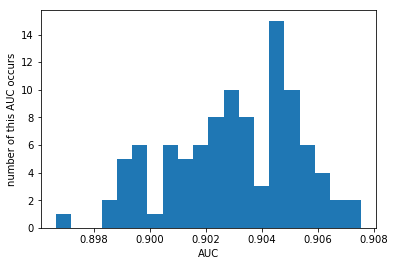

In [11]:
plt.hist(AUC,20)
plt.xlabel("AUC")
plt.ylabel("number of this AUC occurs")
plt.show()


In [12]:
np.min(AUC)

0.89666245667867051

In [13]:
np.max(AUC)

0.90751944523065264

In [14]:
np.std(AUC)

0.0022719498932977831

In [15]:
np.mean(AUC)

0.90300852195297965